## Import the libraries

In [0]:
import warnings
import numpy as np                                            #Exploratory Data Analysis
import pyspark.pandas as ps
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.offline import iplot
from random import random
from pyspark.ml import Pipeline                                #Modeling
from pyspark.ml.regression import LinearRegression, DecisionTreeRegressor, RandomForestRegressor, GBTRegressor
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.evaluation import RegressionEvaluator
import mlflow                                                  #Deployment
import mlflow.sklearn
import mlflow.azureml
import azureml
from azureml.core import Workspace
from azureml.core.authentication import InteractiveLoginAuthentication
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

### Mount the Azure Storage

In [0]:
dbutils.fs.mount(
  source = "wasbs://dataset@pricedatastorage.blob.core.windows.net",
  mount_point = "/mnt/data",
  extra_configs = {"fs.azure.account.key.pricedatastorage.blob.core.windows.net":"UUpMhyQ6jNC4fFy2QbYKaomV+hJAXB3P1oSxDP9jQyXIpBc1ljzZb4wAZQ4U7eyTYphlEHso+4tj+AStbx1GPQ=="})

**Import the dataset**

In [0]:
df = spark.read.csv('/mnt/data/train.csv',inferSchema=True,header=True)
test_df = spark.read.csv('/mnt/data/test.csv',inferSchema=True,header=True)

**Convert spark dataframe into pandas dataframe**

In [0]:
df = df.to_pandas_on_spark()
df = df.to_pandas()

In [0]:
test_df = test_df.to_pandas_on_spark()
test_df = test_df.to_pandas()

In [0]:
df.display()

key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
2009-06-15T17:26:21.000+0000,4.5,2009-06-15T17:26:21.000+0000,-73.844311,40.721319,-73.84161,40.712278,1
2010-01-05T16:52:16.000+0000,16.9,2010-01-05T16:52:16.000+0000,-74.016048,40.711303,-73.979268,40.782004,1
2011-08-18T00:35:00.000+0000,5.7,2011-08-18T00:35:00.000+0000,-73.982738,40.76127,-73.991242,40.750562,2
2012-04-21T04:30:42.000+0000,7.7,2012-04-21T04:30:42.000+0000,-73.98713,40.733143,-73.991567,40.758092,1
2010-03-09T07:51:00.000+0000,5.3,2010-03-09T07:51:00.000+0000,-73.968095,40.768008,-73.956655,40.783762,1
2011-01-06T09:50:45.000+0000,12.1,2011-01-06T09:50:45.000+0000,-74.000964,40.73163,-73.972892,40.758233,1
2012-11-20T20:35:00.000+0000,7.5,2012-11-20T20:35:00.000+0000,-73.980002,40.751662,-73.973802,40.764842,1
2012-01-04T17:22:00.000+0000,16.5,2012-01-04T17:22:00.000+0000,-73.9513,40.774138,-73.990095,40.751048,1
2012-12-03T13:10:00.000+0000,9.0,2012-12-03T13:10:00.000+0000,-74.006462,40.726713,-73.993078,40.731628,1
2009-09-02T01:11:00.000+0000,8.9,2009-09-02T01:11:00.000+0000,-73.980658,40.733873,-73.99154,40.758138,2


In [0]:
df.shape

Out[7]: (5500000, 8)

In [0]:
df.describe()

Out[8]:

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,5.500000e+06,5.500000e+06,5.500000e+06,5.499964e+06,5.499964e+06,5.500000e+06
mean,1.134239e+01,-7.250980e+01,3.992242e+01,-7.250923e+01,3.991838e+01,1.684539e+00
std,9.819104e+00,1.281230e+01,9.023598e+00,1.283150e+01,9.250279e+00,1.329587e+00
min,-1.000000e+02,-3.426609e+03,-3.488080e+03,-3.412653e+03,-3.488080e+03,0.000000e+00
25%,6.000000e+00,-7.399206e+01,4.073491e+01,-7.399140e+01,4.073404e+01,1.000000e+00
50%,8.500000e+00,-7.398181e+01,4.075263e+01,-7.398016e+01,4.075315e+01,1.000000e+00
75%,1.250000e+01,-7.396711e+01,4.076711e+01,-7.396368e+01,4.076811e+01,2.000000e+00
max,1.273310e+03,3.439426e+03,3.344459e+03,3.457622e+03,3.345917e+03,2.080000e+02


In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5500000 entries, 0 to 5499999
Data columns (total 8 columns):
 # Column Dtype 
--- ------ ----- 
 0 key datetime64[ns]
 1 fare_amount float64 
 2 pickup_datetime datetime64[ns]
 3 pickup_longitude float64 
 4 pickup_latitude float64 
 5 dropoff_longitude float64 
 6 dropoff_latitude float64 
 7 passenger_count int32 
dtypes: datetime64[ns](2), float64(5), int32(1)
memory usage: 356.7 MB

**Convert object datatype to datetime64[ns]**

In [0]:
df.key = df.key.astype('datetime64[ns]')
df.pickup_datetime = df.pickup_datetime.astype('datetime64[ns]')
test_df.key = test_df.key.astype('datetime64[ns]')
test_df.pickup_datetime = test_df.pickup_datetime.astype('datetime64[ns]')

**Check and drop the null values**

In [0]:
df.isna().sum().sort_values(ascending=False)

Out[11]: dropoff_longitude 36
dropoff_latitude 36
key 0
fare_amount 0
pickup_datetime 0
pickup_longitude 0
pickup_latitude 0
passenger_count 0
dtype: int64

In [0]:
df.dropna(inplace=True)

**Check and drop the records which have negative fare amount**

In [0]:
df[df.fare_amount < 0].fare_amount

Out[13]: 2039 -2.9
2486 -2.5
13032 -3.0
28839 -2.5
36722 -2.5
 ... 
5405802 -4.5
5421557 -4.0
5427513 -5.0
5437260 -16.0
5452791 -2.5
Name: fare_amount, Length: 234, dtype: float64

In [0]:
df.drop(df[df.fare_amount < 0].index, axis = 0, inplace = True)

**Check and drop the records which have passenger count more than 6**

In [0]:
df[df.passenger_count > 6]

Out[15]:

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
929022,2009-07-30 11:54:00,3.30,2009-07-30 11:54:00,0.000000,0.000000,0.000000,0.000000,208
1007609,2014-06-24 15:13:00,104.00,2014-06-24 15:13:00,-74.015780,40.715420,-74.170280,40.708340,9
2154045,2010-12-16 11:21:00,3.30,2010-12-16 11:21:00,0.000000,0.000000,0.000000,0.000000,208
2198549,2010-12-15 14:20:00,3.30,2010-12-15 14:20:00,0.000000,0.000000,0.000000,0.000000,208
2910347,2010-12-16 06:44:00,4.50,2010-12-16 06:44:00,0.000000,0.000000,0.000000,0.000000,208
3107489,2009-05-12 14:50:00,2.70,2009-05-12 14:50:00,-73.937818,40.758260,-73.937827,40.758250,208
3323791,2011-08-27 01:24:00,8.50,2011-08-27 01:24:00,-73.987858,40.760340,-74.000682,40.752413,129
4095440,2015-06-14 08:56:16,37.04,2015-06-14 08:56:16,-73.982094,40.756252,-73.872482,40.774506,9
4103745,2010-12-22 12:11:00,23.70,2010-12-22 12:11:00,0.000000,0.000000,0.000000,0.000000,208
4432483,2009-05-11 13:56:00,11.10,2009-05-11 13:56:00,-73.937733,40.758267,-73.937737,40.758273,208


In [0]:
df.drop(df[df.passenger_count > 6].index, axis = 0, inplace = True)

**Check the standard range of latitude and longitude, if value bound the range then drop**

In [0]:
df.pickup_latitude.between(-90,90,inclusive=True).sum()

Out[17]: 5499627

In [0]:
df.drop(df[df.pickup_latitude < -90].index, axis = 0, inplace = True) 
df.drop(df[df.pickup_latitude > 90].index, axis = 0, inplace = True)

In [0]:
df.dropoff_latitude.between(-90,90,inclusive=True).sum()
df.drop(df[df.dropoff_latitude < -90].index, axis = 0, inplace = True) 
df.drop(df[df.dropoff_latitude > 90].index, axis = 0, inplace = True)

In [0]:
df.pickup_longitude.between(-180,180,inclusive=True).sum()
df.drop(df[df.pickup_longitude < -180].index, axis = 0, inplace = True) 
df.drop(df[df.pickup_longitude > 180].index, axis = 0, inplace = True)

In [0]:
df.dropoff_longitude.between(-180,180,inclusive=True).sum()
df.drop(df[df.dropoff_longitude < -180].index, axis = 0, inplace = True) 
df.drop(df[df.dropoff_longitude > 180].index, axis = 0, inplace = True)

**Function to calculate distance using haversine formula**
- Distance is calculated in miles.

In [0]:
def distance(data, lat1, long1, lat2, long2):
    x = np.sin(np.radians(df[lat2]-df[lat1])/2.0) ** 2 + np.cos(np.radians(df[lat1])) * np.cos(np.radians(df[lat2])) * \
        np.sin(np.radians(df[long2]-df[long1])/2.0) ** 2
    y = 2 * np.arctan2(np.sqrt(x), np.sqrt(1 - x))
    data['distance'] = 3959 * y
    pass

In [0]:
distance(df, 'pickup_latitude', 'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude')

**Feature scaling of pickup datetime**

In [0]:
df['year'] = df.pickup_datetime.dt.year
df['month'] = df.pickup_datetime.dt.month
df['date'] = df.pickup_datetime.dt.day
df['day_of_week'] = df.pickup_datetime.dt.dayofweek
df['hour'] = df.pickup_datetime.dt.hour

## Data Visualization

**Histogram of fare amount**

In [0]:
Hist = [go.Histogram(x=df.fare_amount[:1000000])]
layout = go.Layout(title = 'Fare Amount')
fig = go.Figure(data = Hist, layout = layout)
iplot(fig)

**Scatterplot of passenger count and fare amount**

Out[26]:

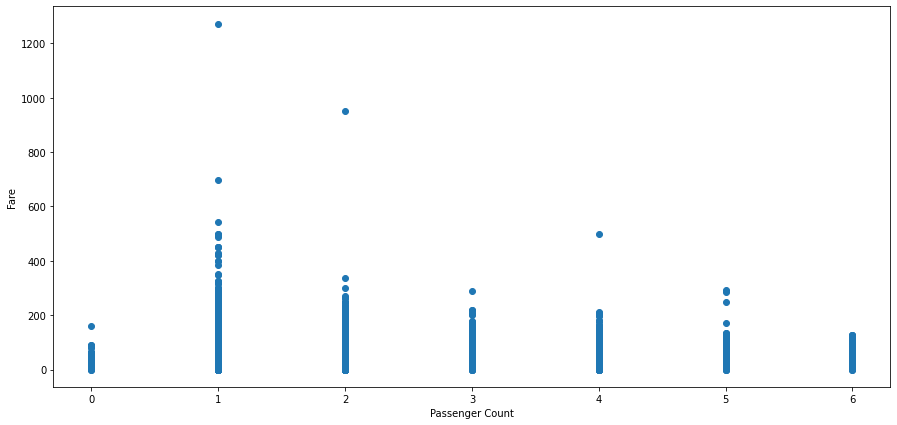

Text(0, 0.5, 'Fare')

In [0]:
plt.figure(figsize=(15,7))
plt.scatter(x=df.passenger_count, y=df.fare_amount)
plt.xlabel('Passenger Count')
plt.ylabel('Fare')

**Scatterplot of date and fare amount**

Out[27]:

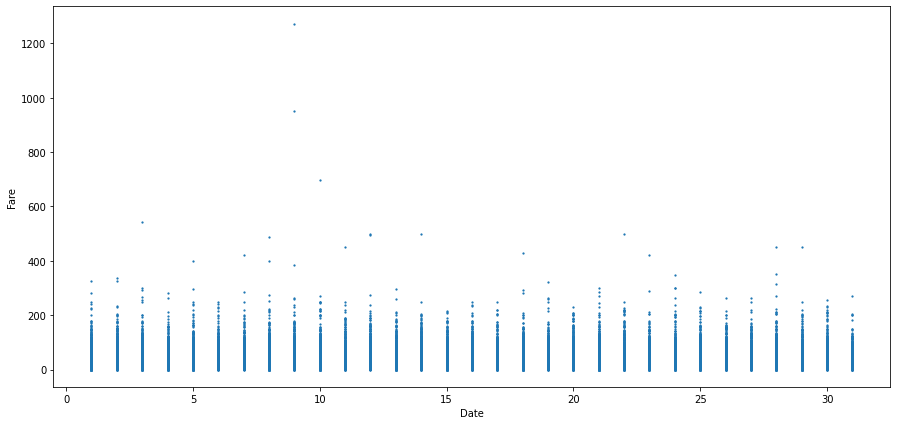

Text(0, 0.5, 'Fare')

In [0]:
plt.figure(figsize=(15,7))
plt.scatter(x=df.date, y=df.fare_amount, s=1.5)
plt.xlabel('Date')
plt.ylabel('Fare')

**Scatterplot of hour and fare**

Out[28]:

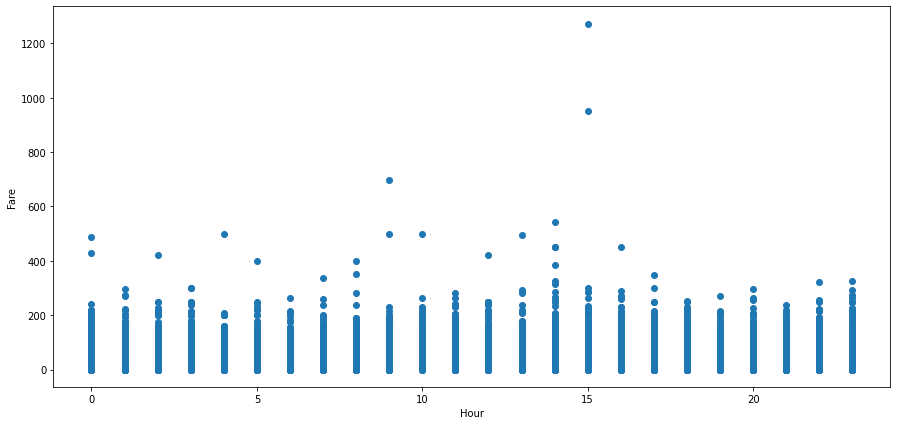

Text(0, 0.5, 'Fare')

In [0]:
plt.figure(figsize=(15,7))
plt.scatter(x=df.hour, y=df.fare_amount)
plt.xlabel('Hour')
plt.ylabel('Fare')

**Scatterplot of fare amount vs day of week**

Out[29]:

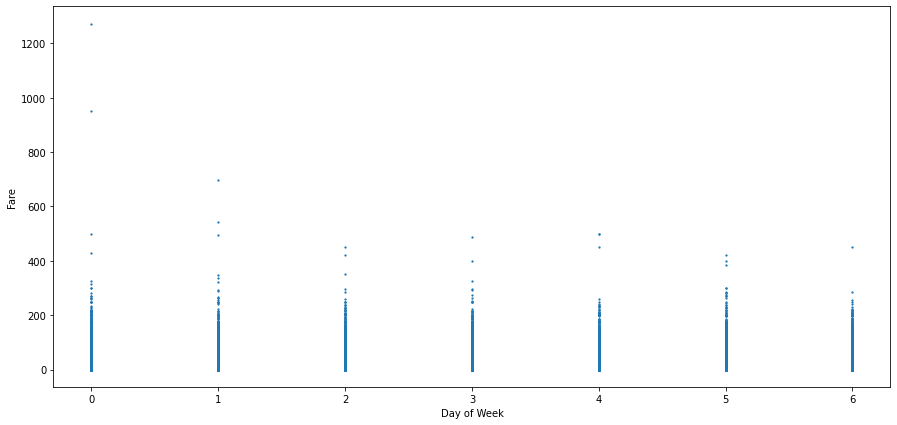

Text(0, 0.5, 'Fare')

In [0]:
plt.figure(figsize=(15,7))
plt.scatter(x=df.day_of_week, y=df.fare_amount, s=1.5)
plt.xlabel('Day of Week')
plt.ylabel('Fare')

**Relation between distance and fare**

Out[30]:

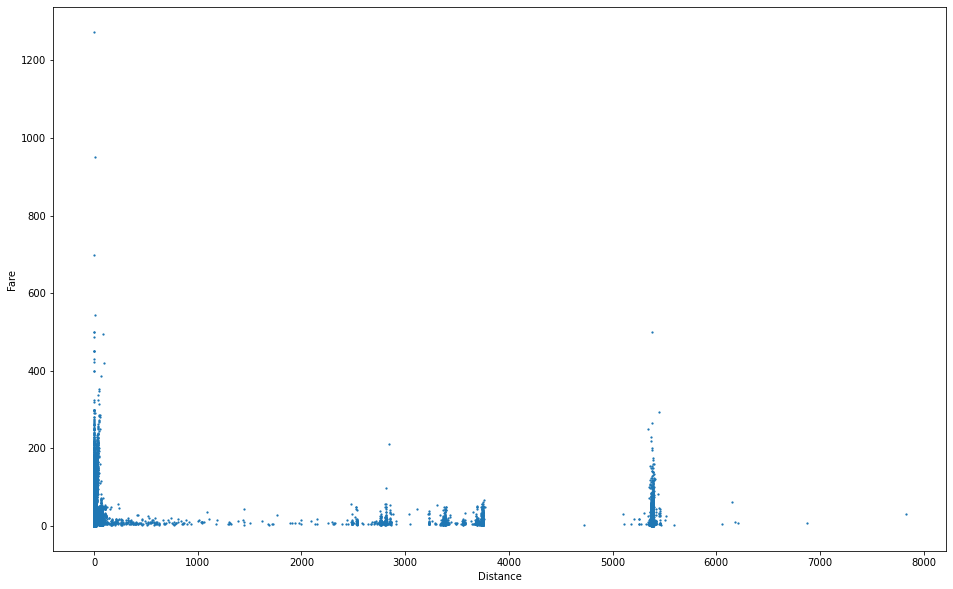

Text(0, 0.5, 'Fare')

In [0]:
plt.figure(figsize=(16,10))
plt.scatter(x=df.distance, y=df.fare_amount, s=1.5)
plt.xlabel('Distance')
plt.ylabel('Fare')

**Distribution of distance relative to fare and linear patterns in the distance**

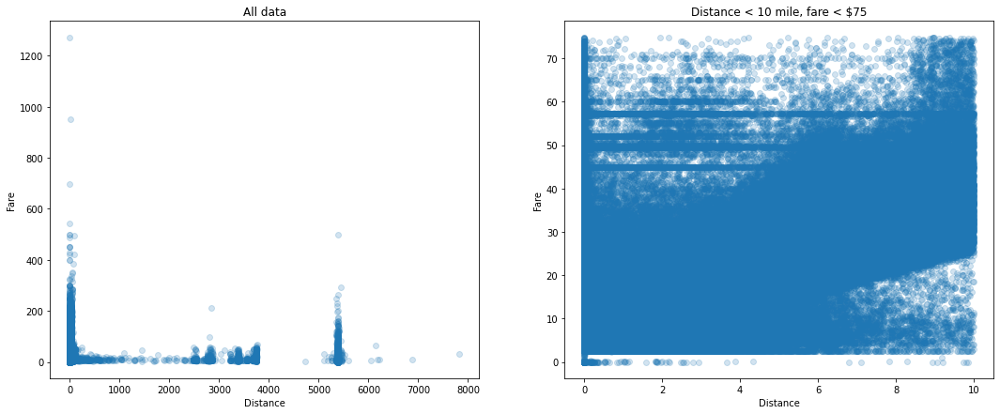

In [0]:
fig, axs = plt.subplots(1, 2, figsize=(18,7))
axs[0].scatter(df.distance, df.fare_amount, alpha=0.2)
axs[0].set_xlabel('Distance')
axs[0].set_ylabel('Fare')
axs[0].set_title('All data')

idx = (df.distance < 10) & (df.fare_amount < 75)
axs[1].scatter(df[idx].distance, df[idx].fare_amount, alpha=0.2)
axs[1].set_xlabel('Distance')
axs[1].set_ylabel('Fare')
axs[1].set_title('Distance < 10 mile, fare < $75');

### Feature Engineering

**Scenario**

- Pickup latitude and longitude are 0, Dropoff latitude and longitude are not 0 but fare amount is 0

- vice versa.

In [0]:
df.drop(df.loc[((df.pickup_latitude == 0) & (df.pickup_longitude == 0))&((df.dropoff_latitude != 0) & (df.dropoff_longitude != 0)) & (df.fare_amount == 0)].index, axis = 0, inplace = True)

In [0]:
df.drop(df.loc[((df.pickup_latitude != 0) & (df.pickup_longitude != 0))&((df.dropoff_latitude == 0) & (df.dropoff_longitude == 0)) & (df.fare_amount == 0)].index, axis = 0, inplace = True)

**There are so many irrelevant records in the correlation of distance and fare.**

So as per the statistics of the data available for the new york city, base fare for the taxi ride is `$`2.5 and average `$`1.56 per mile. 
> Fare = (Distance `*` 1.56) + 2.5

**Check the records if the distance is above 200 and fare amount is not equal to 0**

In [0]:
distance_check = df.loc[(df.distance > 200)&(df.fare_amount != 0)]
distance_check

Out[34]:

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,year,month,date,day_of_week,hour
472,2009-02-22 22:48:00,2.5,2009-02-22 22:48:00,0.000000,0.000000,-74.005433,40.726685,2,5385.945749,2009,2,22,6,22
1260,2011-03-10 20:25:00,5.7,2011-03-10 20:25:00,-73.973907,40.754743,0.000000,0.000000,2,5384.680323,2011,3,10,3,20
2280,2011-08-29 08:24:00,8.9,2011-08-29 08:24:00,-73.936667,40.757815,0.000000,40.757815,1,3744.920829,2011,8,29,0,8
2397,2012-06-24 17:11:10,45.0,2012-06-24 17:11:10,0.000000,0.000000,-74.010230,40.714553,2,5386.038620,2012,6,24,6,17
4278,2015-04-07 23:33:02,7.0,2015-04-07 23:33:02,-73.972702,40.757423,0.000000,0.000000,1,5384.652471,2015,4,7,1,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5498033,2013-01-16 13:50:32,56.8,2013-01-16 13:50:32,0.000000,0.000000,-73.782726,40.648842,2,5373.483411,2013,1,16,2,13
5498148,2015-04-25 16:06:45,13.5,2015-04-25 16:06:45,0.000000,0.000000,-73.984329,40.737274,2,5384.994227,2015,4,25,5,16
5498288,2012-06-21 13:17:00,9.3,2012-06-21 13:17:00,-73.993742,40.759005,-73.993490,0.004457,2,2816.040848,2012,6,21,3,13
5498957,2012-07-13 13:50:00,7.7,2012-07-13 13:50:00,-7.978857,40.741195,-74.000840,40.739035,1,3369.164958,2012,7,13,4,13


**Update all the records with correct values if satisfy the above condition**

In [0]:
distance_check.distance = distance_check.apply(lambda x: (x.fare_amount - 2.50) / 1.56, axis = 1)
df.update(distance_check)

/databricks/python/lib/python3.8/site-packages/pandas/core/generic.py:5494: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

**Check if both distance and fare are 0 then it should be dropped**

In [0]:
df[(df.distance == 0) & (df.fare_amount == 0)]

Out[36]:

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,year,month,date,day_of_week,hour
105051,2013-08-21 21:41:00,0.0,2013-08-21 21:41:00,0.000000,0.000000,0.000000,0.000000,2.0,0.0,2013.0,8.0,21.0,2.0,21.0
331597,2013-08-05 06:45:54,0.0,2013-08-05 06:45:54,-73.982354,40.679971,-73.982354,40.679971,1.0,0.0,2013.0,8.0,5.0,0.0,6.0
436658,2015-03-04 22:33:39,0.0,2015-03-04 22:33:39,-74.043442,40.788208,-74.043442,40.788208,1.0,0.0,2015.0,3.0,4.0,2.0,22.0
689250,2015-05-27 23:10:03,0.0,2015-05-27 23:10:03,-73.994125,40.741131,-73.994125,40.741131,1.0,0.0,2015.0,5.0,27.0,2.0,23.0
1221438,2015-02-02 21:58:28,0.0,2015-02-02 21:58:28,0.000000,0.000000,0.000000,0.000000,2.0,0.0,2015.0,2.0,2.0,0.0,21.0
1598058,2013-08-06 11:12:00,0.0,2013-08-06 11:12:00,0.000000,0.000000,0.000000,0.000000,2.0,0.0,2013.0,8.0,6.0,1.0,11.0
1662545,2010-03-13 02:39:29,0.0,2010-03-13 02:39:29,-74.035278,40.738683,-74.035278,40.738683,2.0,0.0,2010.0,3.0,13.0,5.0,2.0
2214498,2010-02-03 11:44:07,0.0,2010-02-03 11:44:07,-74.014147,40.710546,-74.014147,40.710546,1.0,0.0,2010.0,2.0,3.0,2.0,11.0
2329503,2015-02-19 09:43:11,0.0,2015-02-19 09:43:11,-73.953857,40.813251,-73.953857,40.813251,1.0,0.0,2015.0,2.0,19.0,3.0,9.0
2581417,2015-05-07 19:12:43,0.0,2015-05-07 19:12:43,-73.913727,40.779018,-73.913727,40.779018,1.0,0.0,2015.0,5.0,7.0,3.0,19.0


In [0]:
df.drop(df[(df.distance == 0) & (df.fare_amount == 0)].index, axis = 0, inplace = True)

**Check the fare amount is less than the base amount in the working days then drop it**

In [0]:
df.loc[(((df.hour >= 6) & (df.hour <= 20)) & ((df.day_of_week >= 1) & (df.day_of_week <= 5)) & (df.distance == 0) & (df.fare_amount < 2.5))]

Out[38]:

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,year,month,date,day_of_week,hour
830616,2015-01-21 06:29:21,0.01,2015-01-21 06:29:21,0.000000,0.000000,0.000000,0.000000,1.0,0.0,2015.0,1.0,21.0,2.0,6.0
925892,2015-01-21 14:12:00,1.90,2015-01-21 14:12:00,0.000000,0.000000,0.000000,0.000000,1.0,0.0,2015.0,1.0,21.0,2.0,14.0
1112195,2015-03-25 14:55:38,1.60,2015-03-25 14:55:38,0.000000,0.000000,0.000000,0.000000,2.0,0.0,2015.0,3.0,25.0,2.0,14.0
1215355,2015-05-29 18:15:27,2.00,2015-05-29 18:15:27,-73.903214,40.747318,-73.903214,40.747318,1.0,0.0,2015.0,5.0,29.0,4.0,18.0
2097377,2013-08-30 15:11:00,0.50,2013-08-30 15:11:00,-121.340000,38.903350,-121.340000,38.903350,1.0,0.0,2013.0,8.0,30.0,4.0,15.0
2322071,2010-02-25 12:44:00,1.25,2010-02-25 12:44:00,-73.937722,40.758318,-73.937722,40.758318,5.0,0.0,2010.0,2.0,25.0,3.0,12.0
2949904,2015-01-22 13:34:00,2.00,2015-01-22 13:34:00,0.000000,0.000000,0.000000,0.000000,1.0,0.0,2015.0,1.0,22.0,3.0,13.0
3010346,2015-01-23 08:50:38,0.01,2015-01-23 08:50:38,0.000000,0.000000,0.000000,0.000000,1.0,0.0,2015.0,1.0,23.0,4.0,8.0
4112515,2015-04-15 20:12:10,0.01,2015-04-15 20:12:10,-73.994553,40.750240,-73.994553,40.750240,1.0,0.0,2015.0,4.0,15.0,2.0,20.0
4920415,2013-08-09 18:39:00,1.50,2013-08-09 18:39:00,0.000000,0.000000,0.000000,0.000000,1.0,0.0,2013.0,8.0,9.0,4.0,18.0


In [0]:
df.drop(df.loc[(((df.hour >= 6) & (df.hour <= 20)) & ((df.day_of_week >= 1) & (df.day_of_week <= 5)) & 
                  (df.distance == 0) & (df.fare_amount < 2.5))].index, axis = 0, inplace = True)

**Check and drop the records if fare is less than base amount on the weekends**

In [0]:
df.loc[((df.day_of_week == 0) | (df.day_of_week == 6)) & (df.distance == 0) & (df.fare_amount < 2.5)]

Out[40]:

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,year,month,date,day_of_week,hour
2414636,2015-01-12 21:09:25,1.0,2015-01-12 21:09:25,-73.880669,40.740891,-73.880669,40.740891,1.0,0.0,2015.0,1.0,12.0,0.0,21.0


In [0]:
df.drop(df.loc[((df.day_of_week == 0) | (df.day_of_week == 6)) & (df.distance == 0) & (df.fare_amount < 2.5)].index, axis = 0, inplace = True)

**Check if fare is 0 but distance is not 0 then impute it with mathematical calculation**

In [0]:
fare_check = df.loc[(df.fare_amount == 0) & (df.distance != 0)]
fare_check.sort_values('distance',ascending = False)

Out[42]:

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,year,month,date,day_of_week,hour
3614406,2015-05-12 08:28:24,0.0,2015-05-12 08:28:24,-73.820679,40.665684,-74.181442,40.687679,1.0,18.966283,2015.0,5.0,12.0,1.0,8.0
5325349,2015-02-07 01:58:09,0.0,2015-02-07 01:58:09,-74.009926,40.736710,-74.282852,40.614143,3.0,16.621915,2015.0,2.0,7.0,5.0,1.0
1107618,2015-05-31 01:52:15,0.0,2015-05-31 01:52:15,-73.997482,40.758915,-74.144936,40.946930,4.0,15.105223,2015.0,5.0,31.0,6.0,1.0
3763201,2010-03-05 21:43:42,0.0,2010-03-05 21:43:42,-73.786049,40.641929,-73.981236,40.782779,4.0,14.114868,2010.0,3.0,5.0,4.0,21.0
1902135,2010-03-08 20:23:36,0.0,2010-03-08 20:23:36,-73.786727,40.640482,-73.979946,40.762910,5.0,13.191238,2010.0,3.0,8.0,0.0,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211499,2010-03-08 18:22:00,0.0,2010-03-08 18:22:00,-73.937353,40.758227,-73.937358,40.758230,1.0,0.000334,2010.0,3.0,8.0,0.0,18.0
2771692,2015-05-31 04:40:53,0.0,2015-05-31 04:40:53,-73.896584,40.752499,-73.896584,40.752502,1.0,0.000264,2015.0,5.0,31.0,6.0,4.0
495273,2015-05-26 12:28:03,0.0,2015-05-26 12:28:03,-73.986473,40.721909,-73.986473,40.721905,1.0,0.000264,2015.0,5.0,26.0,1.0,12.0
670254,2015-02-22 19:26:37,0.0,2015-02-22 19:26:37,-73.994370,40.750725,-73.994370,40.750721,1.0,0.000264,2015.0,2.0,22.0,6.0,19.0


In [0]:
fare_check.fare_amount = fare_check.apply(lambda x: ((x.distance * 1.56) + 2.5), axis = 1)
df.update(fare_check)

/databricks/python/lib/python3.8/site-packages/pandas/core/generic.py:5494: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

**Check if fare is above 3 but distance is equal to 0 then correct the distance according to the fare**

In [0]:
dist_check = df.loc[(df.fare_amount > 3) & (df.distance == 0)]
dist_check.sort_values('fare_amount',ascending = False)

Out[44]:

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,year,month,date,day_of_week,hour
1144706,2015-03-09 15:12:00,1273.31,2015-03-09 15:12:00,0.000000,0.000000,0.000000,0.000000,1.0,0.0,2015.0,3.0,9.0,0.0,15.0
3723759,2015-03-10 09:48:00,698.16,2015-03-10 09:48:00,0.000000,0.000000,0.000000,0.000000,1.0,0.0,2015.0,3.0,10.0,1.0,9.0
101885,2011-09-12 09:33:56,500.00,2011-09-12 09:33:56,-73.965961,40.640595,-73.965961,40.640595,1.0,0.0,2011.0,9.0,12.0,0.0,9.0
3770478,2013-01-21 03:57:00,300.25,2013-01-21 03:57:00,-73.990137,40.756872,-73.990137,40.756872,1.0,0.0,2013.0,1.0,21.0,0.0,3.0
2427679,2015-01-03 03:57:26,300.00,2015-01-03 03:57:26,-73.969688,40.592640,-73.969688,40.592640,1.0,0.0,2015.0,1.0,3.0,5.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4828186,2011-05-12 09:39:20,3.30,2011-05-12 09:39:20,-73.983423,40.744259,-73.983423,40.744259,1.0,0.0,2011.0,5.0,12.0,3.0,9.0
366224,2009-07-30 10:05:21,3.30,2009-07-30 10:05:21,-73.137393,41.366138,-73.137393,41.366138,1.0,0.0,2009.0,7.0,30.0,3.0,10.0
4125935,2011-08-02 16:57:00,3.30,2011-08-02 16:57:00,-73.982505,40.735358,-73.982505,40.735358,2.0,0.0,2011.0,8.0,2.0,1.0,16.0
3841998,2013-05-22 10:28:00,3.27,2013-05-22 10:28:00,0.000000,0.000000,0.000000,0.000000,1.0,0.0,2013.0,5.0,22.0,2.0,10.0


In [0]:
dist_check.distance = dist_check.apply(lambda x: ((x.distance - 2.5) / 1.56), axis = 1)
df.update(dist_check)

/databricks/python/lib/python3.8/site-packages/pandas/core/generic.py:5494: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

**Check if distance is above 100 but fare is still lower than 100, then fare should be imputed with correct values**

In [0]:
target_check = df.loc[(df.fare_amount < 100) & (df.distance > 100)]
target_check.sort_values(['distance','fare_amount'], ascending = False)

Out[46]:

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,year,month,date,day_of_week,hour
1632032,2013-04-21 15:13:00,11.0,2013-04-21 15:13:00,-74.002510,40.734320,-70.183332,40.756540,1.0,199.922210,2013.0,4.0,21.0,6.0,15.0
2811044,2012-03-22 08:34:00,5.3,2012-03-22 08:34:00,-74.005112,40.741367,-77.816665,40.732262,1.0,199.544089,2012.0,3.0,22.0,3.0,8.0
1357154,2010-05-11 16:24:42,10.9,2010-05-11 16:24:42,-70.961200,42.505300,-73.967621,40.762009,1.0,196.489427,2010.0,5.0,11.0,1.0,16.0
4822280,2013-09-02 20:28:00,8.5,2013-09-02 20:28:00,-73.983740,40.734302,-77.716667,40.743877,1.0,195.421917,2013.0,9.0,2.0,0.0,20.0
1738206,2013-01-10 14:47:00,7.5,2013-01-10 14:47:00,-77.633333,40.784112,-73.967712,40.768627,2.0,191.793184,2013.0,1.0,10.0,3.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1926509,2011-03-11 21:45:31,49.8,2011-03-11 21:45:31,-73.963062,39.629601,-75.342620,40.643574,1.0,101.090299,2011.0,3.0,11.0,4.0,21.0
3286123,2011-03-28 15:43:49,49.8,2011-03-28 15:43:49,-75.329236,40.645135,-73.958087,39.627681,2.0,100.938013,2011.0,3.0,28.0,0.0,15.0
4507221,2014-09-16 04:51:00,11.5,2014-09-16 04:51:00,-73.980398,40.734552,-75.468602,41.670472,1.0,100.834201,2014.0,9.0,16.0,1.0,4.0
1937753,2015-05-08 13:51:46,20.5,2015-05-08 13:51:46,-72.063202,40.834679,-73.982452,40.772621,2.0,100.473338,2015.0,5.0,8.0,4.0,13.0


In [0]:
target_check.fare_amount = target_check.apply(lambda x: ((x.distance * 1.56) + 2.5), axis = 1)
df.update(target_check)

/databricks/python/lib/python3.8/site-packages/pandas/core/generic.py:5494: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

**After all corrections, correlation of distance and fare amount should be linear and fair**

Out[48]:

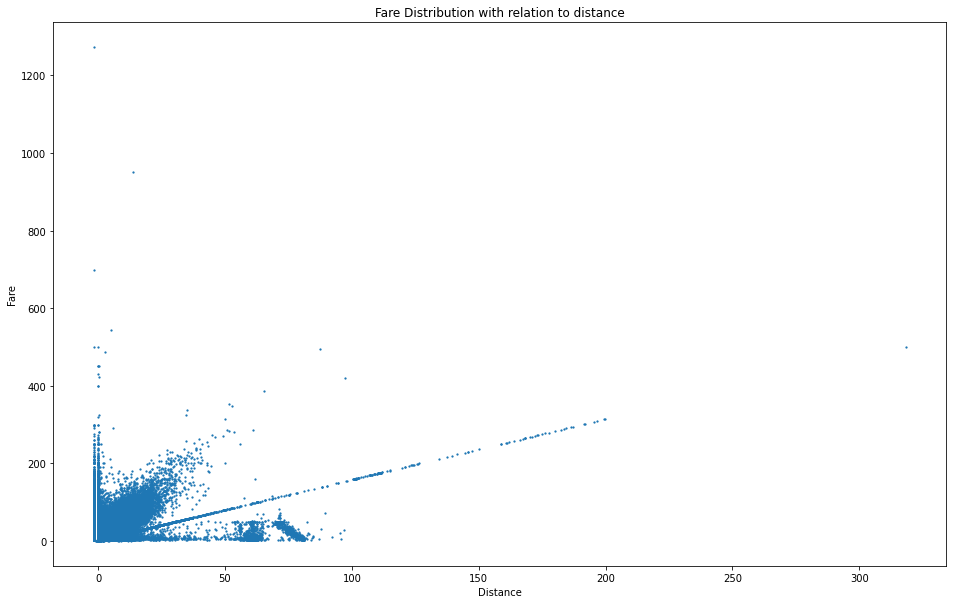

Text(0.5, 1.0, 'Fare Distribution with relation to distance')

In [0]:
fig, ax = plt.subplots(1, 1, figsize=(16,10))
ax.scatter(x=df.distance, y=df.fare_amount, s=1.5)
ax.set_xlabel('Distance')
ax.set_ylabel('Fare')
ax.set_title('Fare Distribution with relation to distance')

**Get the minimum and maximum range of the co-ordinates from the test dataset to plot the graph**

In [0]:
bb = (min(test_df.pickup_longitude.min(), test_df.dropoff_longitude.min()), 
      max(test_df.pickup_longitude.max(), test_df.dropoff_longitude.max()), 
      min(test_df.pickup_latitude.min(), test_df.dropoff_latitude.min()), 
      max(test_df.pickup_latitude.max(), test_df.dropoff_latitude.max()))
bb

Out[49]: (-74.263242, -72.986532, 40.568973, 41.709555)

**Function filter the range of pickup and dropoff locations from the training dataset**

In [0]:
def filter_range(df, bb):
    return (df.pickup_longitude >= bb[0]) & (df.pickup_longitude <= bb[1]) & \
           (df.pickup_latitude >= bb[2]) & (df.pickup_latitude <= bb[3]) & \
           (df.dropoff_longitude >= bb[0]) & (df.dropoff_longitude <= bb[1]) & \
           (df.dropoff_latitude >= bb[2]) & (df.dropoff_latitude <= bb[3])

**Plot of non-linear traffic in the city**

Out[51]:

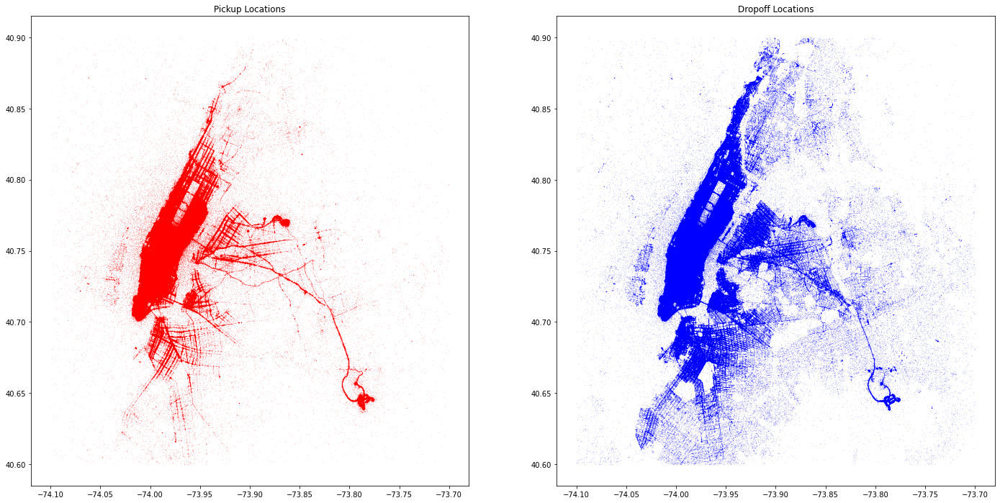

<matplotlib.collections.PathCollection at 0x7ff5074a9280>

In [0]:
fig, axs = plt.subplots(1, 2, figsize=(24,12))
idx = filter_range(df, (-74.1, -73.7, 40.6, 40.9))
axs[0].set_title('Pickup Locations')
axs[0].scatter(df[idx].pickup_longitude, df[idx].pickup_latitude, c='r', s=0.01, alpha=0.5)
axs[1].set_title('Dropoff Locations')
axs[1].scatter(df[idx].dropoff_longitude, df[idx].dropoff_latitude, c='b', s=0.01, alpha=0.5)

**Correlation map of features**

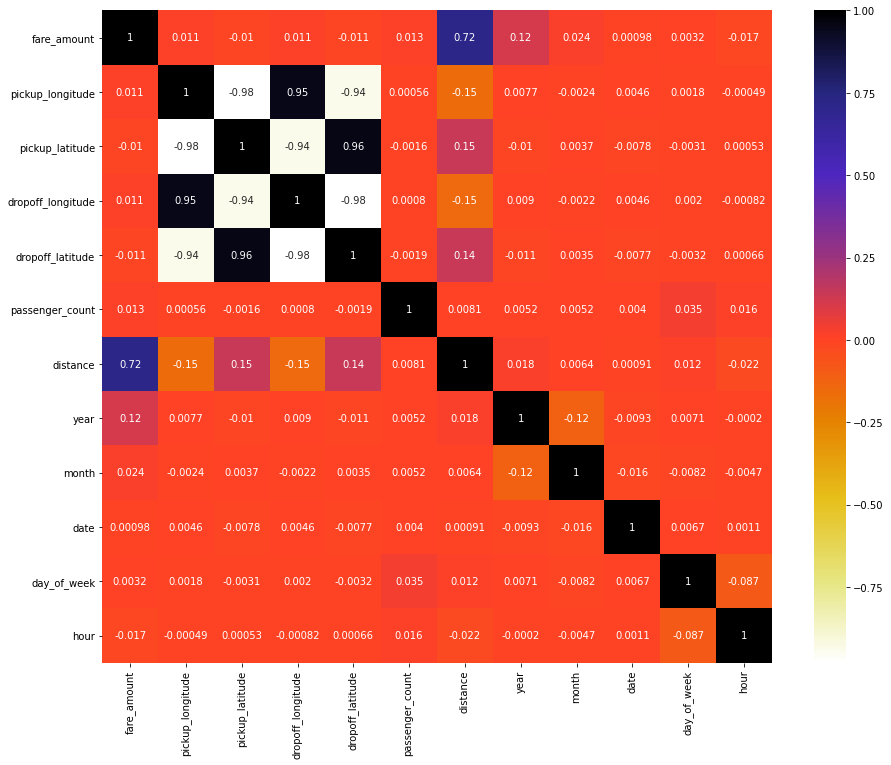

In [0]:
plt.figure(figsize=(15,12))
cor = df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

**Prepare the test dataset**

In [0]:
distance(test_df, 'pickup_latitude', 'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude')

In [0]:
test_df['year'] = test_df.pickup_datetime.dt.year
test_df['month'] = test_df.pickup_datetime.dt.month
test_df['date'] = test_df.pickup_datetime.dt.day
test_df['day_of_week'] = test_df.pickup_datetime.dt.dayofweek
test_df['hour'] = test_df.pickup_datetime.dt.hour

**Drop the insignificant variables**

In [0]:
df.drop(['key','pickup_datetime'], axis = 1, inplace = True)
test_df.drop(['key','pickup_datetime'], axis = 1, inplace = True)

**Convert pandas dataframe to spark dataframe for further modeling**

In [0]:
train_df = ps.from_pandas(df)
train_df = train_df.to_spark()

## Modeling

**Linear Regression**

In [0]:
feature_assembler = VectorAssembler(inputCols=['pickup_longitude', 'dropoff_longitude', 'passenger_count', 'distance', 'year', 'month', 'date'], outputCol="features")

lr = LinearRegression(labelCol="fare_amount")

pipeline = Pipeline(stages=[feature_assembler, lr])

train, test = train_df.randomSplit([0.75, 0.25])

lr_model = pipeline.fit(train)

predictions = lr_model.transform(test)

evaluator = RegressionEvaluator(labelCol= 'fare_amount', predictionCol= 'prediction')

print('RMSE:', evaluator.evaluate(predictions, {evaluator.metricName: "rmse"}))
print('R-squared:', evaluator.evaluate(predictions, {evaluator.metricName: "r2"}))

RMSE: 6.633929890520642
R-squared: 0.543772495001323

**Decision Tree**

In [0]:
feature_assembler = VectorAssembler(inputCols=['pickup_longitude', 'dropoff_longitude', 'passenger_count', 'distance', 'year', 'month', 'day_of_week', 'hour'], outputCol="features")

dt = DecisionTreeRegressor(labelCol="fare_amount")

pipeline = Pipeline(stages=[feature_assembler, dt])

train, test = train_df.randomSplit([0.75, 0.25])

dt_model = pipeline.fit(train)

predictions = dt_model.transform(test)

evaluator = RegressionEvaluator(labelCol= 'fare_amount', predictionCol= 'prediction')

print('RMSE:', evaluator.evaluate(predictions, {evaluator.metricName: "rmse"}))
print('R-squared:', evaluator.evaluate(predictions, {evaluator.metricName: "r2"}))

RMSE: 5.21864244430954
R-squared: 0.7163783358922924

**Random Forest**

In [0]:
feature_assembler = VectorAssembler(inputCols=['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'passenger_count', 'distance', 'year', 'month', 'date', 'hour'], outputCol="features")

rf = RandomForestRegressor(labelCol="fare_amount")

pipeline = Pipeline(stages=[feature_assembler, rf])

train, test = train_df.randomSplit([0.75, 0.25])

rf_model = pipeline.fit(train)

predictions = rf_model.transform(test)

evaluator = RegressionEvaluator(labelCol= 'fare_amount', predictionCol= 'prediction')

print('RMSE:', evaluator.evaluate(predictions, {evaluator.metricName: "rmse"}))
print('R-squared:', evaluator.evaluate(predictions, {evaluator.metricName: "r2"}))

RMSE: 5.272022521421218
R-squared: 0.7149434807349793

**Gradient Boosting**

In [0]:
feature_assembler = VectorAssembler(inputCols=['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'passenger_count', 'distance', 'year', 'month', 'date', 'day_of_week'], outputCol="features")

gbr = GBTRegressor(labelCol="fare_amount")

pipeline = Pipeline(stages=[feature_assembler, gbr])

train, test = train_df.randomSplit([0.75, 0.25])

gbr_model = pipeline.fit(train)

predictions = gbr_model.transform(test)

evaluator = RegressionEvaluator(labelCol= 'fare_amount', predictionCol= 'prediction')

print('RMSE:', evaluator.evaluate(predictions, {evaluator.metricName: "rmse"}))
print('R-squared:', evaluator.evaluate(predictions, {evaluator.metricName: "r2"}))

RMSE: 4.83464460555877
R-squared: 0.7590224066207748

## Deployment

**Create or load an Azure ML workspace**
> It will load a workspace or create a new one if it does not exist.

In [0]:
workspace_name = "fare-prediction"
workspace_location = "eastus"
resource_group = "NYC_Price_Prediction"
subscription_id = "75b2e7f9-9c16-4ece-9685-e7db922c1b62"   
authentication = InteractiveLoginAuthentication(tenant_id = "bc7e12a8-5234-4447-9371-44fc05a1d39c")

workspace = Workspace.create(name = workspace_name,
                             location = workspace_location,
                             resource_group = resource_group,
                             subscription_id = subscription_id,
                             auth = authentication,
                             exist_ok = True)

**Train the best performance model on the dataset using MLflow to log metrics, parameters, artifacts and model**

In [0]:
def fare_training(df, alpha, n_estimators):
    warnings.filterwarnings("ignore")
    if float(alpha) is None:
        alpha = 0.9
    else:
        alpha = float(alpha)
    
    if int(n_estimators) is None:
        n_estimators = 100
    else:
        n_estimators = int(n_estimators)
        
    np.random.seed(42)
    train, test = train_test_split(df)
    X_train = train.drop(["fare_amount"], axis=1)
    X_test = test.drop(["fare_amount"], axis=1)
    y_train = train[["fare_amount"]]
    y_test = test[["fare_amount"]]

    def evaluation_metrics(true, pred):
        return np.sqrt(mean_squared_error(true, pred)), mean_absolute_error(true, pred), r2_score(true, pred)
  
    with mlflow.start_run() as run:
        gbr = GradientBoostingRegressor(alpha=alpha, n_estimators = n_estimators, random_state = 42)
        gbr.fit(X_train, y_train)

        predictions = gbr.predict(X_test)

        (rmse, mae, r2) = evaluation_metrics(y_test, predictions)

        print("GradientBoostingRegressor(alpha=%f, n_estimators=%f):" % (alpha, n_estimators))
        print("  RMSE: %s" % rmse)
        print("  MAE: %s" % mae)
        print("  R2 Score: %s" % r2)

        mlflow.log_param("alpha", alpha)
        mlflow.log_param("n_estimators", n_estimators)
        
        mlflow.log_metric("rmse", rmse)
        mlflow.log_metric("mae", mae)
        mlflow.log_metric("r2", r2)
        
        mlflow.sklearn.log_model(gbr, "model")
        
        temp = int(random()*1000)
        path = "/dbfs/mlflow/fare_test/model-%f-%f-%f" % (alpha, n_estimators, temp)
        mlflow.sklearn.save_model(gbr, path)

        run_id = run.info.run_id
        print('Run ID: ', run_id)
        model_uri = "runs:/" + run_id + "/model"
        print('model_uri: ', model_uri)

    return run_id, model_uri

In [0]:
run_id, model_uri = fare_training(df, 0.01, 80)

GradientBoostingRegressor(alpha=0.010000, n_estimators=80.000000):
 RMSE: 4.476233007228593
 MAE: 2.1169716019690727
 R2 Score: 0.7922299745641197
Run ID: cbcad7aa4cb24cf9b66be21b47ba602c
model_uri: runs:/cbcad7aa4cb24cf9b66be21b47ba602c/model

**Create a container image for trained model to deploy in Azure Container Instances(ACI) using MLflow**

Further as per the requirement container image can be deployed to ACI for staging which serve as REST endpoint and Azure Kubernetes Service(AKS) for production.

In [0]:
model_image, azure_model = mlflow.azureml.build_image(model_uri = model_uri, 
                                                      workspace = workspace,
                                                      model_name = "gbr-model",
                                                      image_name = "gbr-model",
                                                      description="Gradient Boosting Regressor for fare prediction",
                                                      synchronous=False)
model_image.wait_for_creation(show_output=True)

Registering model gbr-model
2022/08/17 16:03:04 INFO mlflow.azureml: Registered an Azure Model with name: `gbr-model` and version: `1`
Creating image
2022/08/17 16:03:09 INFO mlflow.azureml: Building an Azure Container Image with name: `gbr-model` and version: `1`